In [1]:
import pandas as pd

In [8]:
df = pd.read_csv('clustering_results.csv')

In [9]:
df

,image path,encoding,initial cluster,secondary cluster,person,loc,relationship,person_cluster,similarity
0,dataset/1970s_D-10376.jpg,[-0.17081152 0.13608162 0.06034306 -0.121915...,27,6,Wu Hong Hong,"(409, 884, 676, 617)",NaN,17,0.937622
1,dataset/Opening3_D-012870.jpg,[-1.21194229e-01 6.64252639e-02 4.37825397e-...,7,5,NaN,"(2446, 2495, 2669, 2272)",NaN,-1,0.934816
2,dataset/Opening3_D-012870.jpg,[-0.14935204 0.0626177 -0.01340208 -0.053958...,2,2,NaN,"(2310, 812, 2631, 491)",NaN,-1,0.789503
3,dataset/Opening3_D-012870.jpg,[-0.10438931 0.05997325 0.06371981 -0.007992...,5,2,NaN,"(2627, 1646, 2782, 1491)",NaN,-1,0.812408
4,dataset/Opening3_D-012870.jpg,[-1.64301157e-01 3.22850831e-02 -6.31048456e-...,2,9,NaN,"(2050, 5913, 2272, 5690)",NaN,-1,0.804760
...,...,...,...,...,...,...,...,...,...
984,dataset/D-191344_grandfather.jpg,[-0.04460219 0.12104383 0.08546685 -0.059056...,0,0,NaN,"(1068, 2356, 2724, 700)",NaN,-1,0.911249
985,dataset/2007-8_Beijing-friend-visit_1.tiff,[-5.41538447e-02 1.05684832e-01 9.94241312e-...,23,7,NaN,"(368, 612, 497, 483)",NaN,-1,0.940085
986,dataset/1988_WithTakamiAkihkoAndHuangrui_Bio_C...,[-0.14540559 0.03945479 0.11937281 -0.010820...,26,1,Akihiko Takami,"(999, 1429, 1128, 1300)",NaN,-1,0.847109
987,dataset/1988_WithTakamiAkihkoAndHuangrui_Bio_C...,[-0.21817829 0.02943441 0.1096921 0.023234...,17,6,NaN,"(970, 1844, 1099, 1715)",NaN,-1,0.834288


In [ ]:
person_name = 'Zhang Yi Mou'
result = df.loc[df['person'] == person_name]

result

,image path,encoding,initial cluster,secondary cluster,person,loc,relationship,person_cluster
211,dataset/2007-8_Beijing-friend-visit_3.tiff,[-0.13733023 0.10503975 0.04412018 0.025075...,15,3,Zhang Yi Mou,"(295, 1071, 402, 963)",NaN,21
365,dataset/2007-8_Beijing-friend-visit_5.tiff,[-1.10759057e-01 1.65474012e-01 8.88178945e-...,15,3,Zhang Yi Mou,"(343, 1477, 450, 1369)",NaN,21
830,dataset/2007-8_Beijing-friend-visit.tiff,[-1.57391146e-01 1.49463400e-01 5.90091497e-...,15,3,Zhang Yi Mou,"(288, 975, 442, 820)",NaN,21
983,dataset/2004_Tan_Dun_Zhang_D-1361.jpg,[-0.12969787 0.17952594 0.06819823 0.041840...,15,3,Zhang Yi Mou,"(752, 2282, 907, 2127)",NaN,21


In [ ]:
df.loc[df['person']== "Zhang Yi Mo", 'person'] = 'Zhang Yi Mou'


In [5]:
import face_recognition
import cv2
import pickle
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity


In [2]:

# Function to generate encoding for the uploaded image
def generate_encoding(image_path, detection_method='cnn'):
    image = cv2.imread(image_path)
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    boxes = face_recognition.face_locations(rgb, model=detection_method)
    encodings = face_recognition.face_encodings(rgb, boxes)
    return encodings[0] if encodings else None


In [3]:
def find_similar_photos(uploaded_image_encoding, df):
    # Step 1: Calculate the cosine similarity between the uploaded image encoding and all others
    df['similarity'] = df['encoding'].apply(lambda x: cosine_similarity([uploaded_image_encoding], [x])[0][0])
    
    # Step 2: Identify the most similar photo
    most_similar_row = df.loc[df['similarity'].idxmax()]
    initial_cluster = most_similar_row['initial cluster']
    person = most_similar_row['person']
    
    print(f"Initial Cluster: {initial_cluster}, Person: {person}")
    
    # Step 3: Retrieve and sort photos based on conditions
    if pd.notna(person):  # If the person is not None
        cluster_df = df[df['person'] == person].sort_values(by='similarity', ascending=False)
    else:  # Otherwise, use the initial cluster
        cluster_df = df[df['initial cluster'] == initial_cluster].sort_values(by = 'similarity', ascending=False)
    
    # Step 4: Return the result
    return cluster_df


In [13]:
import pandas as pd
from IPython.display import display, Image
from PIL import Image as PILImage

# Assuming the following functions are defined:
# - generate_encoding(image_path): generates encoding for the uploaded image.
# - find_similar_photos(encoding, df): finds similar photos based on the provided encoding.

# Example usage
uploaded_image_path = '/Users/digital-archives/Downloads/WechatIMG17.jpg'
uploaded_image_encoding = generate_encoding(uploaded_image_path)

if uploaded_image_encoding is not None:
    # Find similar photos
    similar_photos_df = find_similar_photos(uploaded_image_encoding, df)
    
    # Check if there are any similar photos found
    if not similar_photos_df.empty:
        # Print the dataframe with specific columns
        print(similar_photos_df[['image path', 'similarity']])
        
        # Print the total number of similar photos found
        print(f"Total similar photos found: {len(similar_photos_df)}")
    else:
        print("No similar photos found.")
else:
    print("No face detected in the uploaded image.")

Initial Cluster: 23, Person: Cai Wen You
                                            image path  similarity
94            dataset/2006_CaiFamilyatMet_D-001563.jpg    0.963753
462                 dataset/2008_Olympics_D-010473.jpg    0.957701
602         dataset/2006_CaiFamilyatMet_D-003070_h.jpg    0.956479
360                           dataset/2009_D-10472.jpg    0.954911
726                      dataset/Cai_family_and_Ng.png    0.953363
241                               dataset/DSCN0019.jpg    0.951436
728                      dataset/Cai_family_and_Ng.png    0.950382
16                      dataset/2004_family_NY_04.tiff    0.948613
288                                      dataset/_.png    0.947903
559                               dataset/DSCN0060.jpg    0.947607
967                                dataset/1___011.jpg    0.946249
343                       dataset/3___2010Nice_005.jpg    0.943520
554  dataset/1999_CaiandJonHoet_D-002112_Portrait_P...    0.942696
100             datas

In [ ]:
import numpy as np

# The provided string
encoding_str = '''[-0.17081152  0.13608162  0.06034306 -0.12191518 -0.16397695 -0.0209294\n -0.06144938 -0.15750831  0.16478062 -0.12244795  0.24531381 -0.02435591\n -0.21505509 -0.03665001 -0.11043558  0.19414547 -0.17565507 -0.13650493\n -0.03405685  0.02955043  0.1268335   0.04412749  0.05361672 -0.02657927\n -0.10486873 -0.35459867 -0.10144322 -0.03695389 -0.05434878 -0.02235365\n  0.01321502 -0.00813471 -0.23256479 -0.01898675  0.04250669  0.12655859\n -0.05171072 -0.11184796  0.11242212 -0.00250697 -0.24160655  0.07004264\n  0.10179952  0.19228643  0.20964855 -0.03577495  0.00541672 -0.22026302\n  0.1048679  -0.16126958 -0.04775115  0.11376695  0.0531046   0.03729576\n  0.02424459 -0.05485802  0.06118101  0.12911043 -0.17127606 -0.04801524\n  0.14391111 -0.03439419 -0.07704838 -0.13316873  0.19534586  0.10577928\n -0.16689602 -0.20003922  0.09922495 -0.13312589 -0.07693315  0.09102018\n -0.15621197 -0.19748043 -0.24488892 -0.00333865  0.40696526  0.10813671\n -0.15805161 -0.01819502 -0.06167109  0.03087041  0.04267421  0.13601592\n -0.00734966  0.01171637 -0.10886521  0.03512339  0.24261048 -0.0764002\n -0.00435377  0.26873171  0.02179593  0.06396328 -0.01867039  0.06353368\n -0.1190778   0.02184027 -0.16310404 -0.04661909 -0.03096096 -0.03539386\n -0.02358414  0.13897689 -0.11312605  0.10061713 -0.03996463  0.01146639\n -0.00318298 -0.07272144 -0.03651478 -0.04752919  0.07347728 -0.1780798\n  0.17760685  0.1554186   0.06475225  0.08806308  0.1366771   0.0574214\n -0.03115125  0.00535122 -0.19029319 -0.0250064   0.03288565 -0.04329655\n  0.08414899 -0.0496797 ]'''

# Step 1: Remove newlines and extra spaces
cleaned_str = encoding_str.replace('\n', ' ').replace('[', '').replace(']', '').strip()

# Step 2: Split the string into a list of strings
encoding_list = cleaned_str.split()

# Step 3: Convert the list of strings to a list of floats
encoding_floats = [float(i) for i in encoding_list]

# Convert to numpy array (optional)
encoding_array = np.array(encoding_floats)

print(encoding_array)


[-0.17081152  0.13608162  0.06034306 -0.12191518 -0.16397695 -0.0209294
 -0.06144938 -0.15750831  0.16478062 -0.12244795  0.24531381 -0.02435591
 -0.21505509 -0.03665001 -0.11043558  0.19414547 -0.17565507 -0.13650493
 -0.03405685  0.02955043  0.1268335   0.04412749  0.05361672 -0.02657927
 -0.10486873 -0.35459867 -0.10144322 -0.03695389 -0.05434878 -0.02235365
  0.01321502 -0.00813471 -0.23256479 -0.01898675  0.04250669  0.12655859
 -0.05171072 -0.11184796  0.11242212 -0.00250697 -0.24160655  0.07004264
  0.10179952  0.19228643  0.20964855 -0.03577495  0.00541672 -0.22026302
  0.1048679  -0.16126958 -0.04775115  0.11376695  0.0531046   0.03729576
  0.02424459 -0.05485802  0.06118101  0.12911043 -0.17127606 -0.04801524
  0.14391111 -0.03439419 -0.07704838 -0.13316873  0.19534586  0.10577928
 -0.16689602 -0.20003922  0.09922495 -0.13312589 -0.07693315  0.09102018
 -0.15621197 -0.19748043 -0.24488892 -0.00333865  0.40696526  0.10813671
 -0.15805161 -0.01819502 -0.06167109  0.03087041  0.

In [12]:
def string_to_floats(encoding_str):
    cleaned_str = encoding_str.replace('\n', ' ').replace('[', '').replace(']', '').strip()
    encoding_list = cleaned_str.split()
    encoding_floats = [float(i) for i in encoding_list]
    return np.array(encoding_floats)

# Apply the function to the entire 'encoding' column
df['encoding'] = df['encoding'].apply(string_to_floats)
df

,image path,encoding,initial cluster,secondary cluster,person,loc,relationship,person_cluster,similarity
0,dataset/1970s_D-10376.jpg,"[-0.17081152, 0.13608162, 0.06034306, -0.12191...",27,6,Wu Hong Hong,"(409, 884, 676, 617)",NaN,17,0.937622
1,dataset/Opening3_D-012870.jpg,"[-0.121194229, 0.0664252639, 0.0437825397, -0....",7,5,NaN,"(2446, 2495, 2669, 2272)",NaN,-1,0.934816
2,dataset/Opening3_D-012870.jpg,"[-0.14935204, 0.0626177, -0.01340208, -0.05395...",2,2,NaN,"(2310, 812, 2631, 491)",NaN,-1,0.789503
3,dataset/Opening3_D-012870.jpg,"[-0.10438931, 0.05997325, 0.06371981, -0.00799...",5,2,NaN,"(2627, 1646, 2782, 1491)",NaN,-1,0.812408
4,dataset/Opening3_D-012870.jpg,"[-0.164301157, 0.0322850831, -0.0631048456, -0...",2,9,NaN,"(2050, 5913, 2272, 5690)",NaN,-1,0.804760
...,...,...,...,...,...,...,...,...,...
984,dataset/D-191344_grandfather.jpg,"[-0.04460219, 0.12104383, 0.08546685, -0.05905...",0,0,NaN,"(1068, 2356, 2724, 700)",NaN,-1,0.911249
985,dataset/2007-8_Beijing-friend-visit_1.tiff,"[-0.0541538447, 0.105684832, 0.0994241312, -0....",23,7,NaN,"(368, 612, 497, 483)",NaN,-1,0.940085
986,dataset/1988_WithTakamiAkihkoAndHuangrui_Bio_C...,"[-0.14540559, 0.03945479, 0.11937281, -0.01082...",26,1,Akihiko Takami,"(999, 1429, 1128, 1300)",NaN,-1,0.847109
987,dataset/1988_WithTakamiAkihkoAndHuangrui_Bio_C...,"[-0.21817829, 0.02943441, 0.1096921, 0.0232344...",17,6,NaN,"(970, 1844, 1099, 1715)",NaN,-1,0.834288


In [ ]:
df.to_csv('clustering_results.csv', index =False)

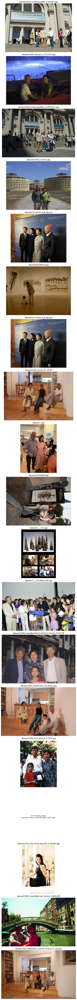

In [15]:
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
# Filter rows where 'person' is "Wu Hong Hong"
filtered_df = similar_photos_df

# Get the 'image path' column
image_paths = filtered_df['image path'].tolist()

# Set up matplotlib figure
fig, axes = plt.subplots(nrows=len(image_paths), ncols=1, figsize=(10, len(image_paths)*5))

# Ensure axes is iterable
if len(image_paths) == 1:
    axes = [axes]

# Load and display each image
for ax, path in zip(axes, image_paths):
    try:
        # Load image
        img = Image.open(path)
        # Display image
        ax.imshow(img)
        ax.set_title(path)
        ax.axis('off')  # Hide axis
    except Exception as e:
        ax.text(0.5, 0.5, f'Error loading image\n{e}', ha='center', va='center')
        ax.axis('off')

# Adjust layout
plt.tight_layout()
plt.show()
